## Lecture 12

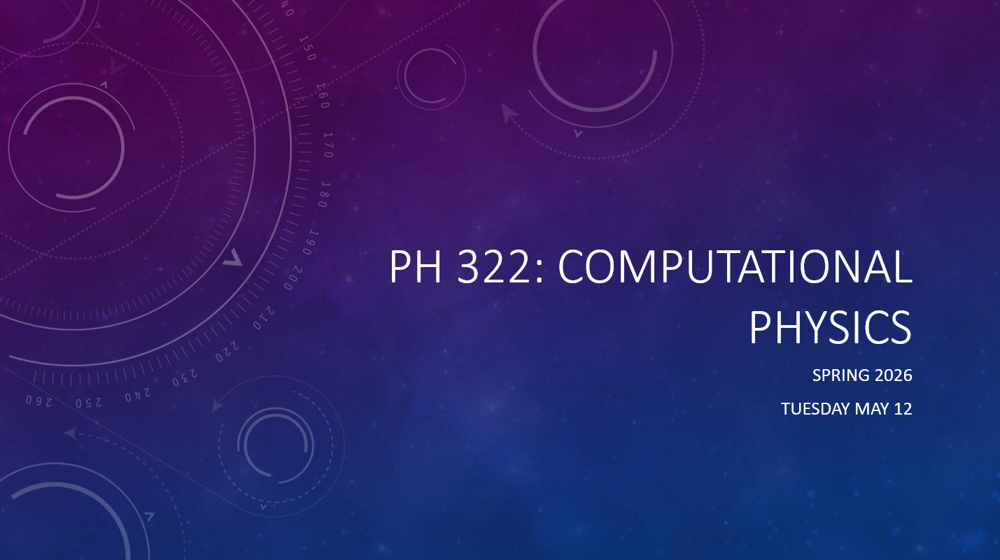

In [1]:
from IPython.display import Image, display
display(Image("G:\\My Drive\\Classes\\Ph322\\2026\\Lectures\\Figures\\header_lecture12.png"))

**Announcements**
* Midterms are graded. The average score was 27.4/42.
* HW 6 due tonight.


**Last Class**
* Ordinary differential equations
    * Euler's method
    * 2nd-order Runge-Kutte method
    * 4th-order Runge-Kutte method
* 1st-order ODE with more than one variable


**Today's Class**
* 2nd-order ODEs.
* System of 2nd-order ODEs.
* Solving ODEs with adaptive step sizes.
* Boundary value problems. 



### Second order differential equations

Many differential equations in physics are second order, that is they are written as second derivatives of the solutions. In this section we learn how to solve these as well, using methods similar to how we solved first order equations.

The trick in solving second-order differential equations is to turn them into *two first-order differential equations*. Since we already know how to solve first-order differential equations, we can solve the second-order problem as well.

**How to turn one 2nd-order equation into two first-order equations**

In general we can write a 2nd-order equation as:

$$
\frac{d^2x}{dt} = f\left(x,\frac{dx}{dt},t\right)
$$

since the second derivative can be a function of $x, t$, and the first derivative, $\frac{dx}{dt}$. 

The trick is to define a second variable $y$ and set it equal to the first derivative of $x$, such that:

$$
\frac{dx}{dt} = y.
$$

With this definition, we can write the 2nd-order differential equation in terms of $y$:

$$
\frac{dy}{dt} = f(x,y,t),
$$

where we replaced $\frac{dx}{dt}$ in the function with $y$. 

Notice now we have converted the single 2nd-order equation into two coupled 1st-order equations:

$$
\frac{d^2x}{dt^2} = f\left(x,\frac{dx}{dt},t\right) \rightarrow 
$$

$$
\frac{dx}{dt} = y, 
$$

$$
\frac{dy}{dt} = f(x,y,t).
$$


This is now a set of two simultaneous first-order differential equations, which we learned how to solve in our last class, by writing the system of equations in vector form. Therefore, we can also write these two equations in vector form, where:

$$
\mathbf{r}=(x,y),
$$ 

$$
\mathbf{f}(\mathbf{r},t) = [y, f(x,y,t)],
$$

and:

$$
\frac{d\mathbf{r}}{dt} = \mathbf{f}(\mathbf{r},t).
$$



To be clear, we can write these equations as:

$$
\frac{dx}{dt} = f_x,
$$

$$
\frac{dy}{dt} = f_y,
$$


so the vector of functions can be written as:

$$
\mathbf{f}(\mathbf{r},t) = [f_x,f_y].
$$

Now that the problem is in this form, we can solve it as a system of first-order ODEs using any one of our ODE methods, e.g., Euler's method, Runge-Kutee method.  


### Practice Exercise -  The non-linear pendulum

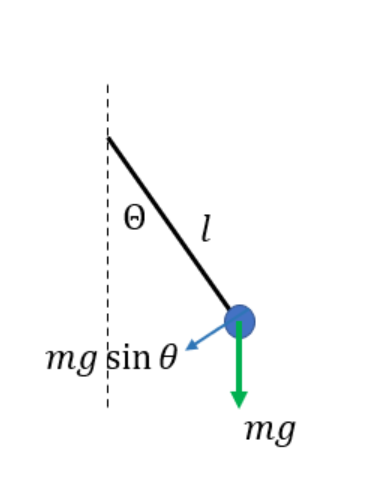

In [21]:
from IPython.display import Image, display
display(Image("G:\\My Drive\\Classes\\Ph322\\2026\\Lectures\\Figures\\nonlinear_pendulum.png"))

Let's practice this method by solving the non-linear pendulum equation.

The pendulum consists of a massless, rigid rod of length $l$ and a bob of mass $m$. The angle of displacement is measured from the vertical. Assume no friction at the pivot point. 

Since the rod is rigid, there is no acceleration along the radial direction. The tangential acceleration of the bob in polar coordinates is:

$$
\alpha = \frac{d^2(l\theta)}{dt^2}.
$$


Applying Newton's second law:

$$
m\frac{d^2(l\theta)}{dt^2} \hat{\theta} = -mg\sin{\theta} \hat{\theta}
$$

where $mg\sin{\theta}$ is component of the gravitational force along $\hat{\theta}$. 

Simplifying, we get:

$$
\frac{d^2\theta}{dt^2} = -\frac{g}{l}\sin{\theta}.
$$



Next, we cast the 2nd-order equation into two first-order equations by defining a new variable $y$ equal to the first derivative of $\theta$:

$$
\frac{d\theta}{dt} = y.
$$

Doing so, the original ODE becomes:

$$
\frac{dy}{dt} = -\frac{g}{l}\sin{\theta}.
$$

We write these two equations in vector form as:

$$
\mathbf{r}=(\theta,y),
$$ 

$$
\mathbf{f}(\mathbf{r},t) = [y, -\frac{g}{l}\sin{\theta} ].
$$

The original 2nd-order ODE is now in a form we can code and solve using one of our ODE methods.



#### Practice

Solve the non-linear pendulum problem use the Euler's method for simplicity to find the solution $\theta(t)$. 

Since this is a 2nd-order equation, we need to specify two initial conditions. Assume the pendulum starts at rest, with an initial displacement angle of $\theta_0 = 45^{\circ}$. Find the solution over the time interval $t=0, 5s$.

Plot $\theta(t)$ and $y(t)$ vs. t. Does your graph make physical sense?


**Experiment with the pendulum**

In the case of a linear pendulum, the period is independent of the amplitude. Is this also true for a nonlinear pendulum? Experiment by changing the initial $\theta$.
 
We can also explore how the oscillation changes with gravity. For example, what is the oscillation for the same pendulum on the moon where the acceleration due to gravity is 1/6 g?



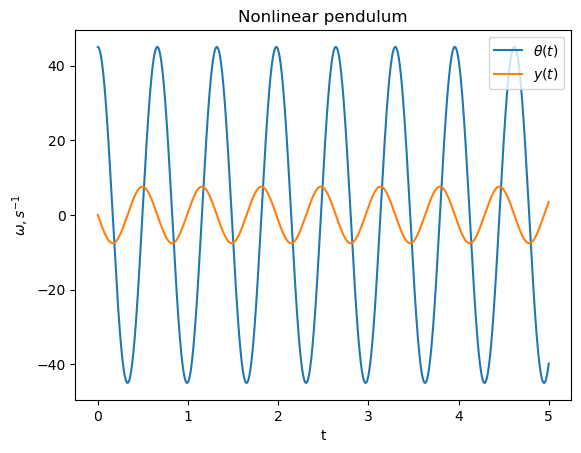

In [6]:
# Practice solving 2nd-order ODE - Pendulum problem

from math import sin, pi, cos
import matplotlib.pyplot as plt
import numpy as np

# define the vector f(r,t),return f_theta, and f_y
def f(r,t):
    
# main body

# define constants
g = 9.81 # m/s2
l = 0.1 # pendulum length, m


# initial conditions

# time interval, s
a = 0
b = 5

# number of time steps


# calculate step size


# create arrays or lists to store solutions and times



# step through interval, calculating x at each step 

    
# plot 





**Animate the pendulum**

Just for fun, I use VPython to visualize the pendulum. Here I use the cylinder object to draw the pendulum arm, and a sphere for the bob. 

I calculate the x,y position of the bob and the end of the arm at every timestep, and change the frame rate accordingly. You can see how relatively simple the code is. 

Note, increase the number of timesteps N above to produce a reasonable animation (N>5000)

In [1]:
%pip install vpython

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 13.2 MB/s  0:00:00 eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached fqdn-1.5.1-py3-none-any.whl.metadata (1.4 kB)
  Using cached isoduration-20.11.0-py3-none-any.whl.metadata (5.7 kB)
  Using cached rfc3987_syntax-1.1.0-py3-none-any.whl.metadata (7.7 kB)
  Using cached uri_template-1.3.0-py3-none-any.whl.metadata (8.8 kB)
  Using cached webcolors-25.10.0-py3-none-any.whl.metadata (2.2 kB)
  Using cached lark-1.3.1-py3-none-any.whl.metadata (1.8 kB)
  Using cached typing_extensions-4.15.0-py3-none-any.whl.metadata (3.3 kB)
  Using cached setuptools-82.0.1-py3-none-any.whl.metadata (6.5 kB)
  Using cached charset_normalizer-3.4.7-cp313-cp313-macosx_10_13_universal2.whl.metadata (40 kB)
  

In [7]:
# Part b: Animate the pendulum

from vpython import canvas, vector, cylinder, sphere, color, rate


canvas()

# position of pendulum pivot
xp = 0
yp = 0

# initial position of arm end and bob
theta0 = r[0]
xbob = xp + l*sin(theta0)
ybob = yp - l*cos(theta0)

arm = cylinder(pos=vector(xp,yp,0), axis=vector(xbob,ybob,0), radius=.001, color=color.blue)
bob = sphere(pos=vector(xbob,ybob,0), radius=0.01, color=color.red)

for theta in r_rk4[0]:
    rate(150)
    xbob = xp + l*sin(theta)
    ybob = yp - l*cos(theta)
    arm.axis = vector(xbob,ybob,0)
    bob.pos = vector(xbob,ybob,0)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

KeyboardInterrupt: 

### 2nd-order ODEs with more than one variable 

Just like in the case of 1st-order ODEs, we may have a system of 2nd-order ODEs with more than one variable.

Here are the equations for the $x$ and $y$ positions of a cannonball shot from a cannon with air resistance. 

$$
\frac{d^2x}{dt^2} = \alpha\frac{dx}{dt}\sqrt{\left(\frac{dx}{dt}\right)^2 + \left(\frac{dy}{dt}\right)^2 }
$$

$$
\frac{d^2y}{dt^2} = -g - \alpha\frac{dy}{dt}\sqrt{\left(\frac{dx}{dt}\right)^2 + \left(\frac{dy}{dt}\right)^2 }
$$

$x$ is the position of the cannonball at time $t$, $y$ is the y-position at time $t$, $g$ is the acceleration due to gravity, and $\alpha$ is a known constant.

Now we have two 2nd-order equations, each depending on the other, so we need to solve them simultaneously. 

Well this is just the situation where we had a set of first-order equations of two variables. The only difference here is that we first need to break these equations into first-order equations. So in this example, where we have two 2nd-order equations, we'll end up with four first-order equations to solve. That means our vector variables in our Python code will store 4 values not just 2. But since Python doesn't care what size our vectors are, there are very few modifications we need to make to our code.

The main work for us is to break these two equations into four first-order equations. 

**Let's write out the four equations here.**

First we define two new variables, call them $v$ and $w$, where $v$ is the first derivative of $x$ and $w$ is the first derivative of $y$:

$$
\frac{dx}{dt} = v
$$

$$
\frac{dy}{dt} = w
$$

Replace the derivatives with these new variables and rewrite the equations above as

$$
\frac{dv}{dt} = \alpha v\sqrt{v^2 + w^2 },
$$

$$
\frac{dw}{dt} = -g - \alpha w\sqrt{v^2 + w^2 }.
$$

Or

$$
\frac{dv}{dt} = f_v(v,w),
$$

$$
\frac{dw}{dt} = f_w(v,w),
$$

where

$$
f_v(v,w) = \alpha v\sqrt{v^2 + w^2 },
$$

and 

$$
f_w(v,w) = -g - \alpha w\sqrt{v^2 + w^2 }.
$$

The main challenge is to keep track of our variable definitions and equate each variable to the correct function. The subscript in the function corresponds to the variable for which we are taking the derivative of, not the variables in the function itself. 

So now we have four first-order ODEs we can solve for the four unknown functions $x(t), y(t), v(t), w(t)$, although we only really care about $x(t)$ and $y(t)$.

Just to make this clear as possible, I write all four equations in the same form:

$$
\frac{dv}{dt} = f_v(v,w,x,y,t)
$$

$$
\frac{dw}{dt} = f_w(v,w,x,y,t)
$$

$$
\frac{dx}{dt} = f_x(v,w,x,y,t)
$$

$$
\frac{dy}{dt} = f_w(v,w,x,y,t)
$$


where:

$$
f_v = \alpha v\sqrt{v^2 + w^2 }
$$

$$
f_w = -g - \alpha w\sqrt{v^2 + w^2 }
$$

$$
f_x = v
$$

$$
f_w = w,
$$

or in vector form:


$$
\frac{d\mathbf{r}}{dt} = \mathbf{f}(\mathbf{r},t).
$$


### Note 

Make sure when writing the code to return the calling function in order, say for example we have:

In [ ]:
r = np.array([v,w,x,y])

def f(r):
    return [f_v, f_w, f_x, f_y]

When we code this, we just have to code each of the four functions into our user-defined function $f$, and make $\mathbf{r}$ a 1D array of size 4. We now need four initial conditions, one for each solution. Other than that, the code is the same.

**Exercise 8.7**

Write a program that
  solves the equations for a cannonball of mass $1\,$kg and radius $8\,$cm,
  shot at $30^\circ$ to the horizontal with initial velocity
  $100\,\mathrm{ms}^{-1}$.  The density of air is
  $\rho=1.22\,\textrm{kg}\,\textrm{m}^{-3}$ and the coefficient of drag for
  a sphere is $C=0.47$.  Make a plot of the trajectory of the cannonball
  (i.e.,a graph of $y$ as a function of$x$).
  
  We are given four initial conditions. Assume the ball starts at $x=0, y=0$ with initial velocity $v_0$ at a launch angle of $30^\circ$. We then simply need to calculate the x and y components of the initial velocity. 

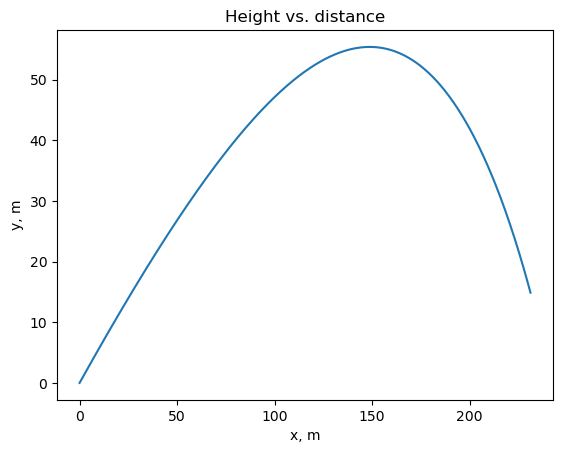

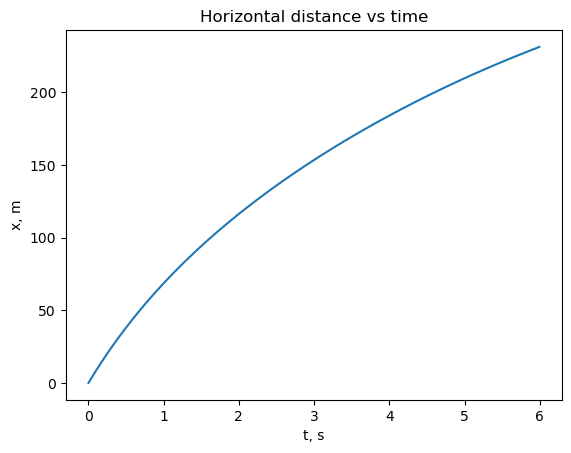

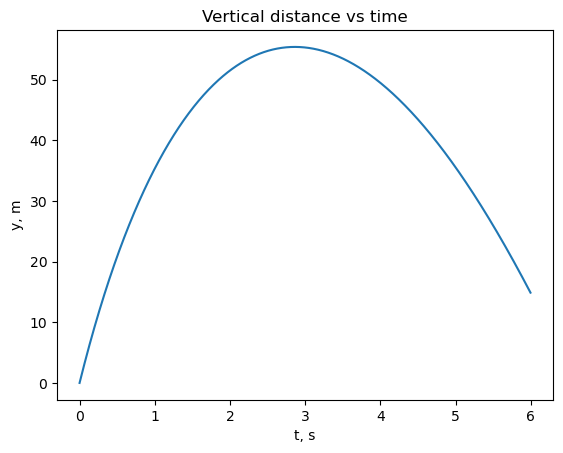

In [20]:
# Practice solving a system of 2nd-order ODEs - Cannonball with air resistance.

from math import sin, pi, sqrt, cos
import matplotlib.pyplot as plt
import numpy as np

# define the vector f(r,t), where r is a 1D array of variables
# returns an array of functions evaluated at vector r and t
def f(r,t):
 

# main body

# define constants
m = 1 # mass of cannonball, kg
R = 0.08 # radius of cannonball, m
rho = 1.22 # density of air, kg/m3
C = 0.47 # coefficient of drag
g = 9.81 # m/s2
alpha  = (pi*R*R*rho*C)/(2*m) # prefactor


# initial conditions
v0 = 100 # initial velocity, m/s
theta0 = 30*(pi/180) # launch angle, radians
r[0] = v0*cos(theta0) # x-component of initial velocity, m/s
r[1] = v0*sin(theta0) # y-component of initial velocity, m/s
r[2] = 0 # initial x-position, m
r[3] = 1e-3 # initial y-position
t = 0

# time interval, s
a = 0
b = 6

# number of time steps
N = 

# calculate step size


# create arrays to store solutions and times



# step through interval, calculating x at each step 





# plot the height of the cannonball vs distance

plt.title("Height vs. distance")
plt.show()

# plot the horizontal distance vs time

plt.title("Horizontal distance vs time")
plt.show()

# plot the vertical distance vs time

plt.title("Vertical distance vs time")
plt.show()

### 4th-order RK method 
$$
h = \frac{b-a}{N}
$$

Approximation Error:
$$
\epsilon \approx h^5
$$
$$
\epsilon \approx c h^5
$$

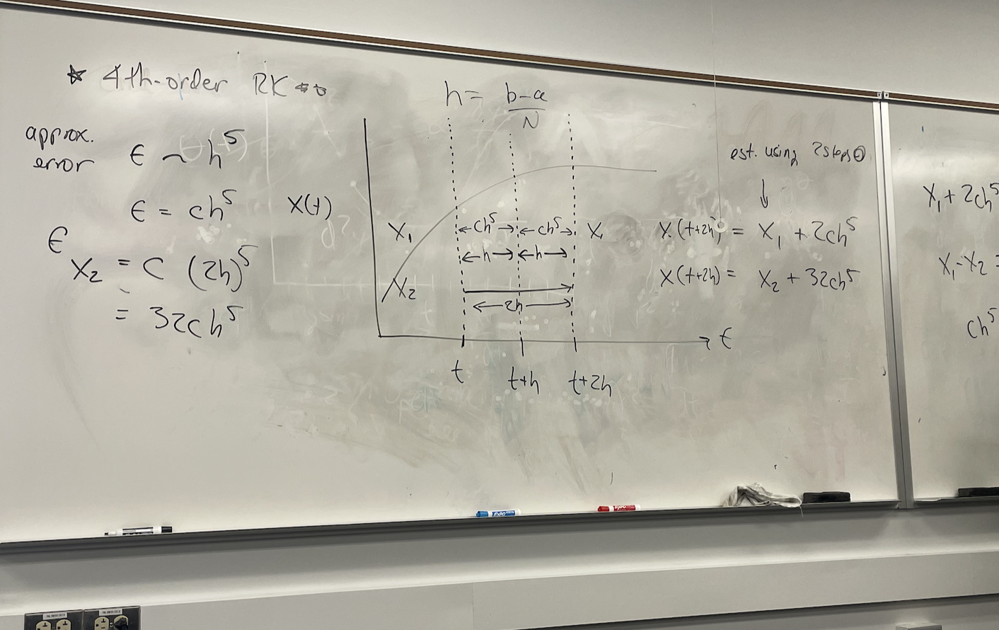

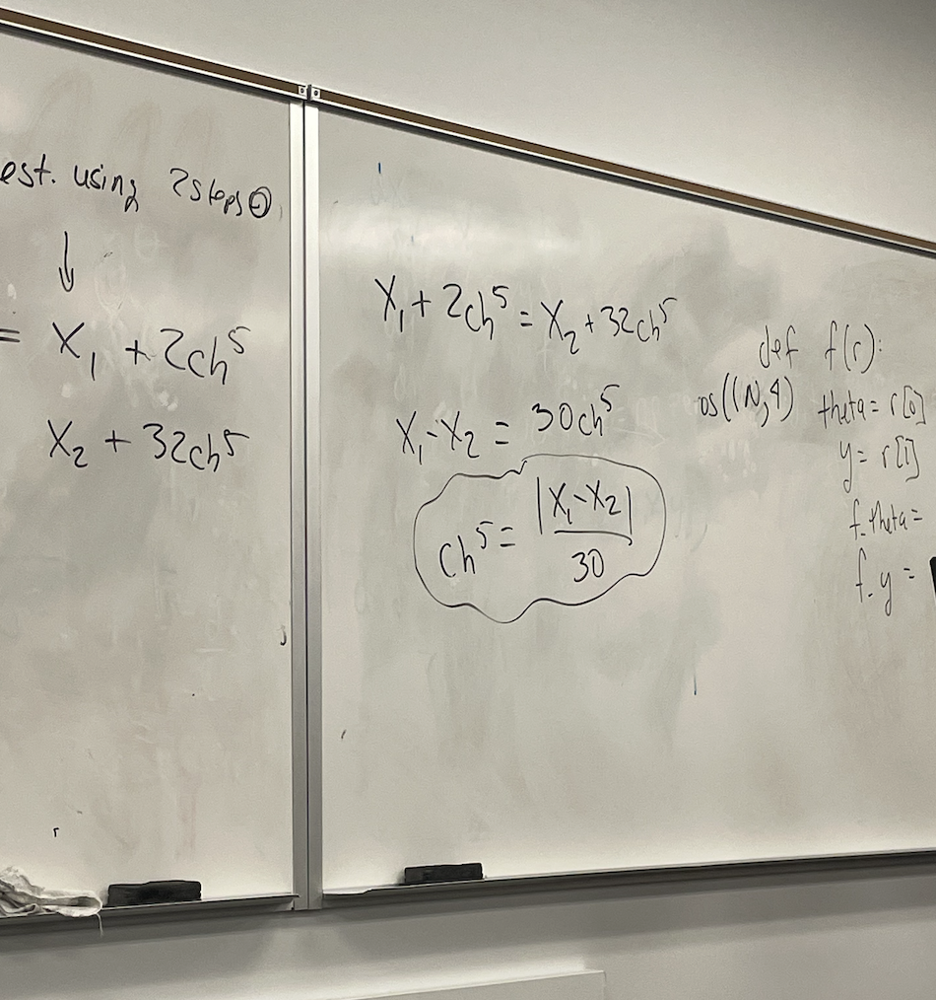

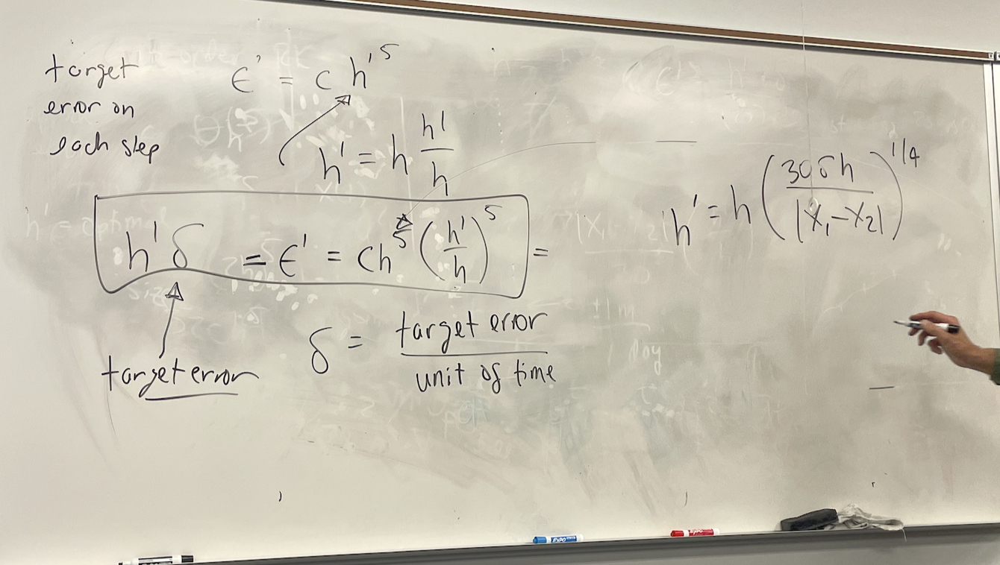

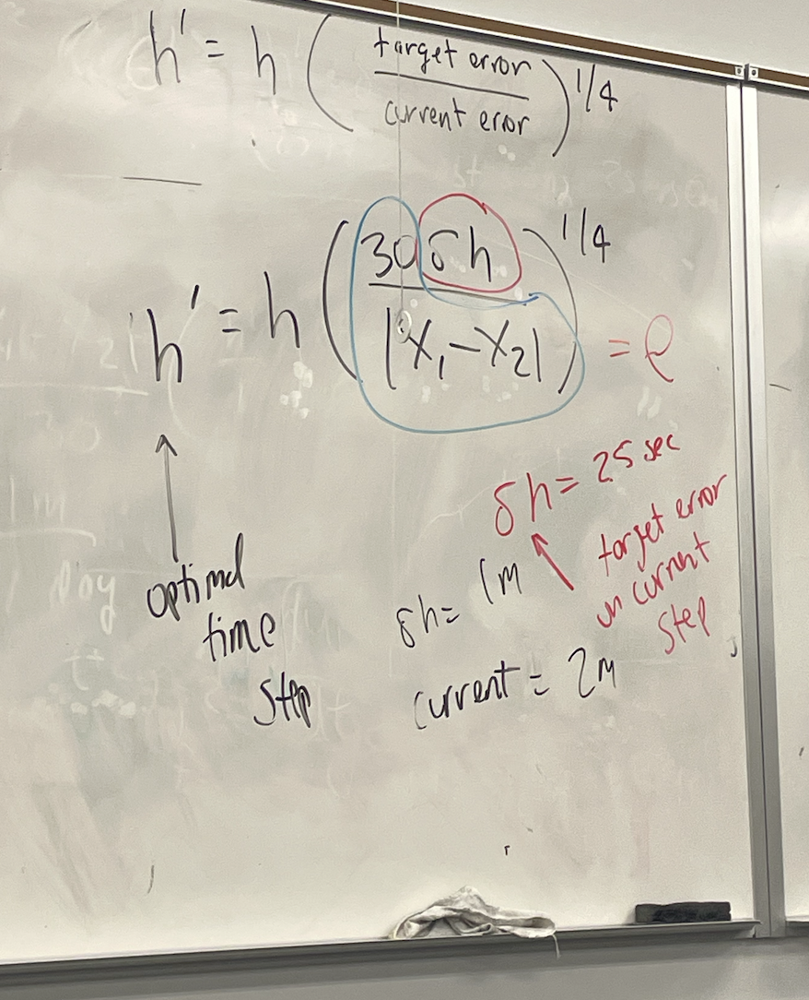

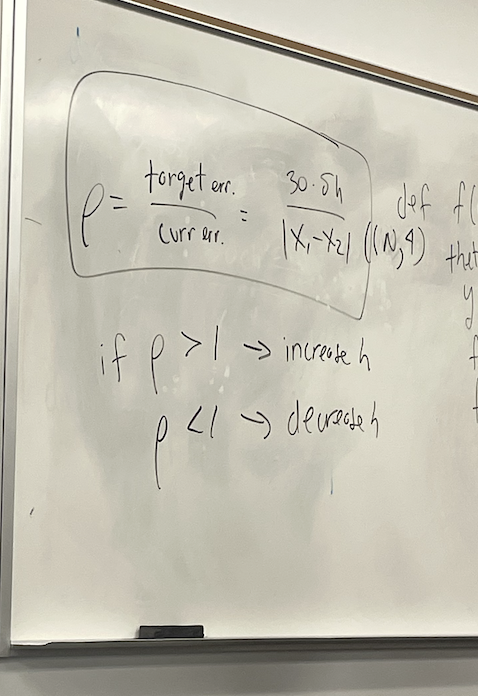

See that we don't really know what the function might be, so the error is just an estimation. 

while: 
    estimate x(t+2h) using 2 steps -> x_1 
                           1 steps -> x_2
    
    calculate \rho

    if (\rho  >1):
        store solution and move on to next time step!
        increate the time step
    
    if (\rho < 1):
        decrease h

    Then go back and re-calculate "h". 
    go back and re-calc  x(t+h), x(t+2h) using the new h, then we know that the errors are with in the bounds. 
    if we are saving in our arrays, we need to go back two indices. 


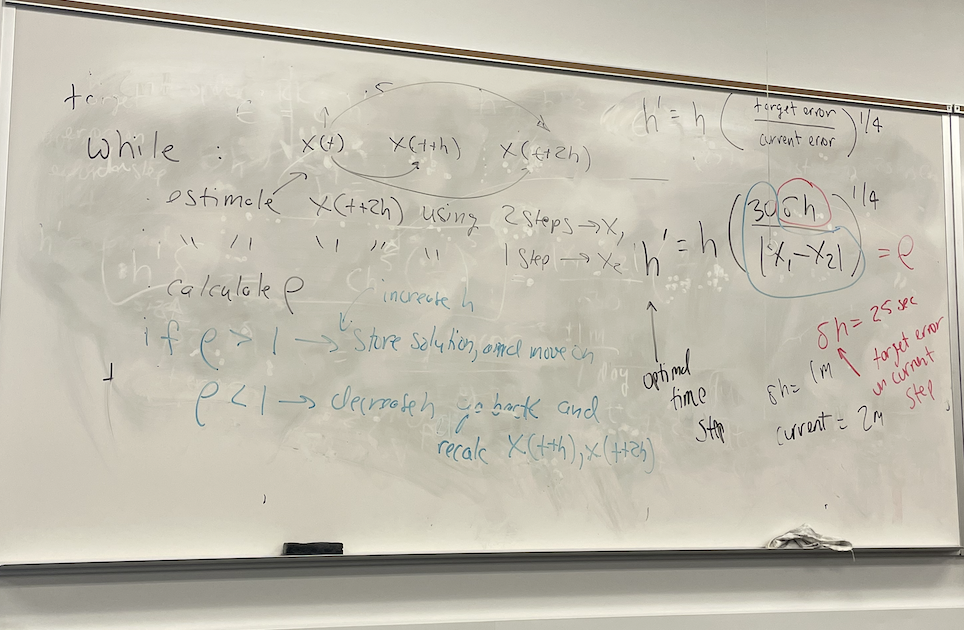

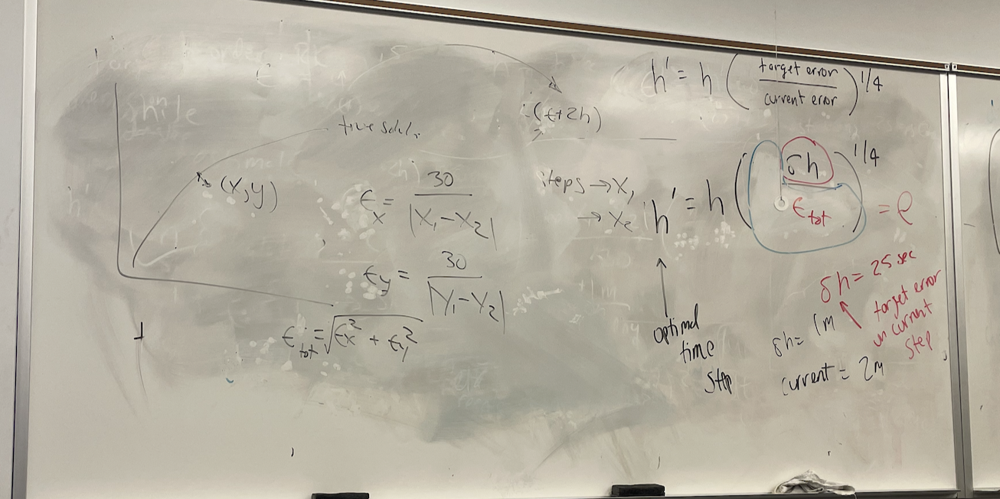

## The adaptive step method

In the numerical methods we have used so far to solve differential equations, we have used a fixed time step, determined by our time interval and the number  of steps $N$ we specify. 

We can see this by plotting the location of the time steps in the solution to the non-linear pendulum problem above. 


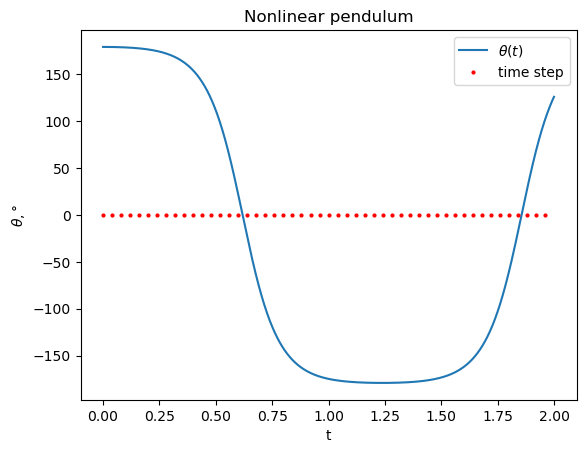

In [19]:
# plot theta vs. t, theta in degrees
plt.plot(tvalues,r_rk4[0]*(180/pi), label=r"$\theta(t)$")
plt.plot(tvalues[::200],np.zeros(len(tvalues[::200])), 'r.', markersize=4, label="time step")

plt.xlabel("t")
plt.ylabel(r"$\theta, \degree$")
plt.legend()
plt.title("Nonlinear pendulum")
plt.show()

Ideally our method to solve differential equations would vary the time step. When the solution is smooth and slow-varying, the method would increase the step size to speed the calculation. And when the solution is rapidly varying, the method would decrease the step size so we could better approximate the solution. This is shown in the figure below where the step size decreases where the function varies rapidly and increases where it is smooth.

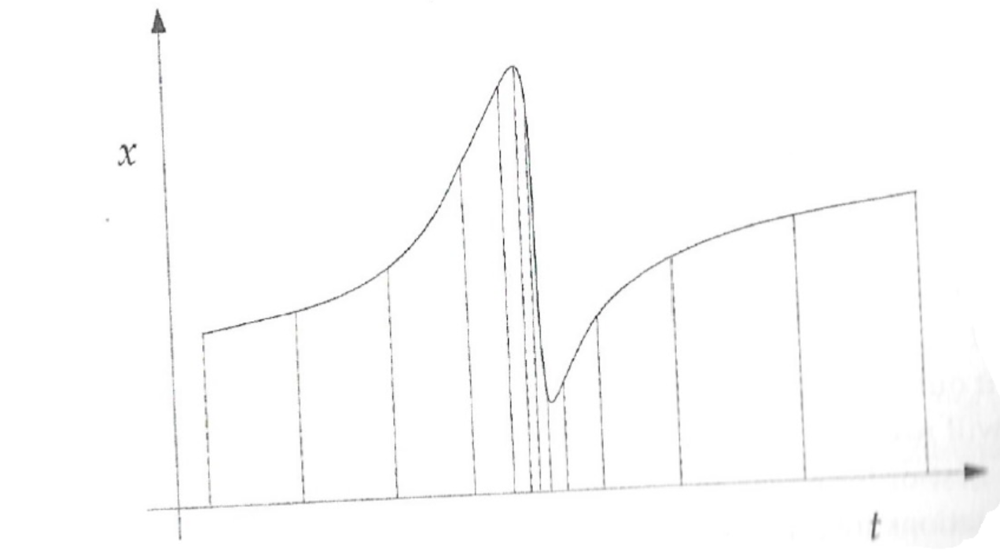

In [22]:
from IPython.display import Image, display
display(Image("G:\\My Drive\\Classes\\Ph322\\2026\\Lectures\\Figures\\adaptive_step_figure8.6.png"))

**Figure 8.6 [Newman]**


Is there such a method? Or is this just a Platonic ideal?  Let's find out ...

The basic idea or governing law that underlies the **adaptive step method** is that we want **the approximation error on every step to be the same**. What approximation error we want is up to the user to decide. In some cases we might need the solution to be extremely accurate, but in other cases maybe not so much. 

If the independent variable is time, the error is usually **specified per unit of time**. For example, if our solution is the position of an object as a function of time, how much error in the position can we live with per second? or per hour? or maybe even per year? But once that target is defined the algorithm should adjust the step size accordingly to ensure the target is met.

It is fairly straightforward to derive what step size we need in order to reach a specified error


We will derive the **adaptive step method for the 4th-order Runge-Kutta method**. 

You may recall that because this is a 4th-order method the solution is accurate to the 4th power of the step size $h$, or equivalently the approximation error on every step is proportional to the 5th power of $h$, or $h^5$. 

The error on any step is then some constant $c$ times $h^5$, or $ch^5$. The error on say two steps is about $2ch^5$.

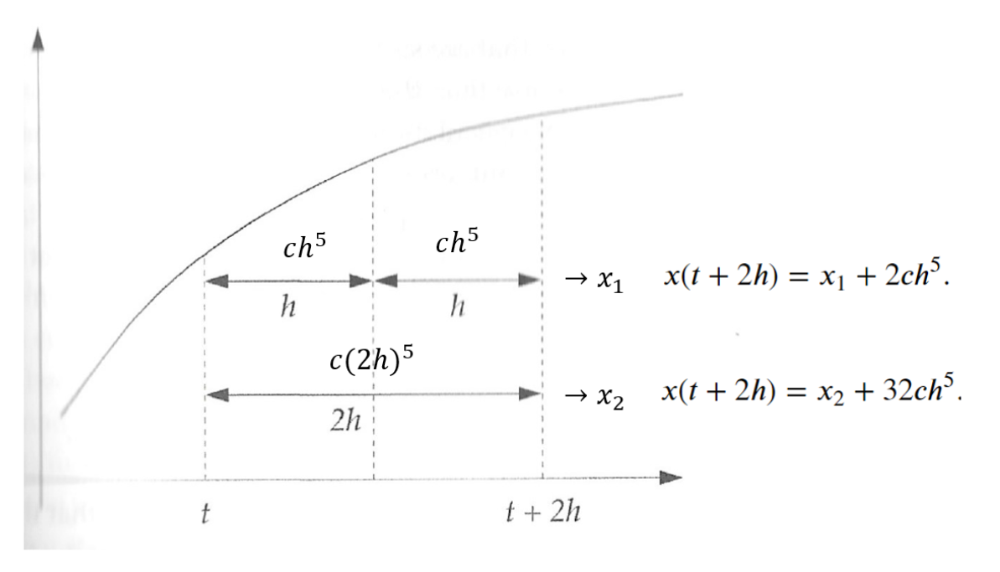

In [23]:
from IPython.display import Image, display
display(Image("G:\\My Drive\\Classes\\Ph322\\2026\\Lectures\\Figures\\adaptive_step_annotated.png"))

**Figure 8.7: The adaptive step method**

The adaptive step method works by first taking two steps with RK each of size $h$, that is we first estimate $x(t+h)$, then $x(t+2h)$. Let's call this estimate of $x(t+2h)$, $x_1$. 

Because we have taken two steps and the error on each step is $ch^5$, the error after two steps is $2ch^5$, so we can write the true value of $x(t+2h)$ as:

$$
x(t+2h) = x_1 + 2ch^5.
$$



Now we go back and re-estimate the solution at $t+2h$, $x(t+2h)$, but this time with a single step of size $2h$. We call this estimate $x_2$, since in general it will not be the same as $x_1$. 

The error on $x_2$ is $c(2h)^5$ = $32ch^5$. So the true value of $x(t+2h)$ is also:

$$
x(t+2h) = x_2 + 32ch^5.
$$

Since these are both expressions for the true value of $x(t+2h)$ we can equate these two equations:

$$
x_1 + 2ch^5 = x_2 + 32ch^5.
$$

Rearranging, we find the **error on each step with step size $h$** is given by:

$$
ch^5 = \frac{1}{30}(x_1-x_2)
$$

So this says we can estimate the error on a step of size $h$ by first calculating $x_1$ and $x_2$. That is, we perform a 2-step RK method with step size $h$, then repeat with a single step of size $2h$.

In general this error $ch^5$ will either be larger or smaller than our target error. If the error is larger than our target error we reduce the error by making $h$ smaller. If the error $ch^5$ is smaller than our target error, we can increase $h$ to reduce the number of steps required, and decrease the time it takes to complete the calculation.

**So what step size is needed in order for the error to equal our target error?**

Let's call our target error $\epsilon '$ and the step size needed for this error $h'$. Then we can write:

$$
\epsilon ' = ch'^5.
$$




In order to relate $h'$ to the current step size $h$, we write $h'$ in terms of $h$:

$$
h' = h\frac{h'}{h},
$$

and substitute this into the above expression for $\epsilon '$, to give 

$$
\epsilon ' = ch^5\left(\frac{h'}{h}\right)^5 .
$$

Now using our expression for $ch^5$ from above yields

$$
\epsilon ' = \frac{1}{30}(x_1-x_2)\left(\frac{h'}{h}\right)^5.
$$


As I mentioned above, we usually want to specify our target error as an allowed amount of error over some time interval (e.g. seconds, years, etc), not per time step, since the time step itself will vary and also may be a much smaller interval of time than we are interested in (for example, if our solution is over years, but the time step is hours). 

Let's then define our target error as some error per unit time, call this $\delta$ (error per unit time). The error on time step $h'$ is then $h'\delta$ (since $h'$ has units of time per step), so we substitute this expression in for $\epsilon '$ above:

$$
h'\delta= \frac{1}{30}(x_1-x_2)\left(\frac{h'}{h}\right)^5.
$$

Now solve this for the optimal step size $h'$':

$$
h' = h\left(\frac{30\delta h}{|x_1-x_2|}\right)^{1/4}
$$

where we take the absolute value of $x_1-x_2$ since we don't care whether the error is positive or negative.



We notice that the ratio in the parentheses is just the ratio between the error that we want on the current time step, $\delta h$, and the actual error on the time step, $|x_1-x_2|/30$.

For convenience we can call this ratio $\rho$,  and rewrite $h'$ as:


$$
h' = h\rho^{1/4}
$$

where 


$$
\rho = \frac{30\delta h}{|x_1-x_2|}.
$$



If $\rho > 1$, the actual error on the current step $x(t+2h)$ meets our target, but is actually *smaller* than it needs to be. So we recalculate the size of the time step as $h\rho^{1/4}$, and proceed to the next step. Since in this case $\rho>1$, $h'$ will be greater than $h$, which will decrease the computation time needed to solve the problem.

If on the other hand $\rho < 1$, the actual error on the current step is *larger* than our target error, so we need to repeat the 2-step RK calculation of the current time step $x(t+2h)$, but with a smaller time step, again calculated by $h\rho^{1/4}$. In this case $\rho<1$ so $h'<h$. We then store these new estimates of $x(t+h)$ and $x(t+2h)$ in our solution, not the estimates calculated with the previous time step $h$.

We then repeat this cycle but now starting at $t+2h$. In each iteration we compute 2 steps of RK using the current value of $h$, and one step using $2h$, then calculate $\rho$. If $\rho>1$ we increase $h$ and go onto the next iteration. But if not, we make $h$ smaller and repeat the calculation of $x(t+h)$ and $x(t+2h)$ with the new smaller time step. There is a general rule of thumb that we don't want to increase the step size from step-to-step more than a factor of 2. So you should also check for this condition at each iteration. 

**A cpl of pointers when programming the adaptive step method:**

* Because the time step size will vary over the time interval from a to b, you do not know in advance the number of time steps $N$. Therefore, you can't define $N$ at the outset. 
* Because the time step size varies,  you do not know in advance at what times $t$ the solutions will be evaluated. Because of this you can't prepopulate a list or an array with values of $t$ like you could when using a fixed step.
* When solving ODEs with a fixed step, we often would use a *for*-loop to loop over each of the $N$ time steps. But we don't know in advance how many steps are needed. A better approach is to use  a *while*- loop to iterate through until we reach the end of the solution interval $b$.
* Before the size of the time step $h$ was calculated as $(b-a)/N$. But this won't work anymore, both because $h$ is not fixed and because we don't know N. So you have to specify a starting value of $h$. Make a reasonable guess based on the length of your time interval a,b. If the independent variable in the ODEs is time, $h$ will have unit of time. If the constants in the ODEs are in SI units, the unit of $h$ will be seconds.
* If on any given step in the iteration the error of the time step is bigger than your target error, you need to repeat that iteration using a smaller time step $h$, and store the updated estimate of $x(t+h)$ and $x(t+2h)$ as your solution, possibly replacing the solution calculated using the previous step size.

Here I repeat the non-linear pendulum problem but using the adaptive time step method.

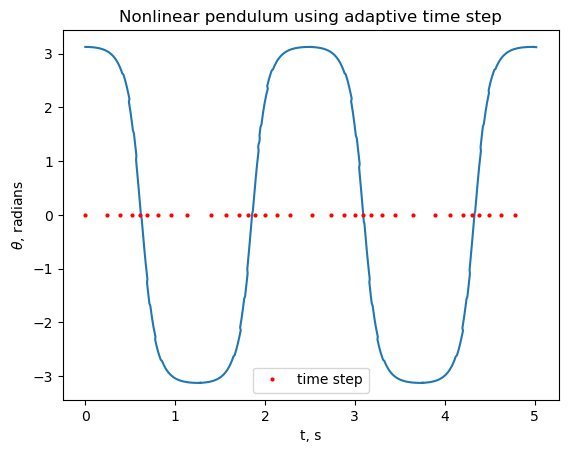

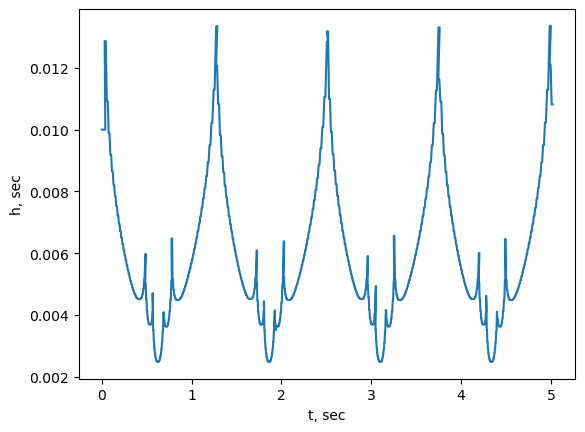

In [5]:
# Practice adaptive step method on pendulum problem

from math import sin, pi, cos
import matplotlib.pyplot as plt
import numpy as np

# define the vector f(r,t), where r is a 1D array of variables
# In this example, f returns both f_theta, and f_y



# define function to calculate solution at t + h using RK4
def rk4(r,t,h):
   

# main body

# define constants
g = 9.81 # m/s2
l = 0.1 # pendulum length, m


# initial conditions
# 0 --> theta, 1--> y
r[0] = 179*(pi/180) # angle in radians
r[1] = 0 # angular velocity, s-1
t = 0

# time interval, s
a = 0
b = 5


# define initial size of time step, seconds


# set target error of theta, in radians
delta  = 1e-7

# create lists to store solutions and add initial values 


# step through interval, until end of interval is reached
while :
    # perform two RK4 steps of size h
    
    # perform one RK4 step of size 2h
    
    # calculate rho  

    # if target error met, store values of t with current h, and make h larger.
   
    # else make h smaller and repeat last two steps of RK4 with smaller h
        
    
    

# Plot theta vs t



In the top plot I again plot the locations of the time steps using the red dots. You see that they are not evenly spaced but are spaced closer where the solution varies rapidly and are spaced farther apart where the solution varies slowly. The bottom plot is the size of the time step $h$ at each time step. You can see the size changes throughout the integration period. 

### The adaptive step method for simultanenous ODEs

The adaptive step method above was derived for a single ODE, with one solution $x(t)$. But as we know we will also have more than one ODE, either in the case of higher order ODEs or a system of first-order equations with multiple variables.

In these cases, where let's say we have four solutions, e.g. $x(t), y(t), v(t), w(t)$, the error on each solution will in general be different since the functional form of each solution is in general different. 

So when we specify the target error, are we imposing this error on all four solutions? just one? some combination of errors on each?

Well the answer is, you decide.

For example, if you are solving a second-order differential equation, 

$$\frac{d^2x}{dt} = x
$$ 

by using the variable $y$ defined as $\frac{dx}{dt} = y$, it's very likely you only care about the solution $x(t)$, since $y(t)$ is just an intermediary variable you defined to be able to calculate $x(t)$. In this case you would use the estimates of $x(t)$ to calculate $\rho$. 

Or let's say you have two 2nd-order differential equations for both the $x$ and $y$ positions of an object (say a comet, as in Exercise 8.10). You want to make sure the position of the object in 2D space is accurate. In this case you could combine the errors on both $x$ and $y$: 

$\epsilon_x = \frac{1}{30}(x_1-x_2)
$

$\epsilon_y = \frac{1}{30}(y_1-y_2)
$

as:

$\epsilon = \sqrt{\epsilon_x^2 + \epsilon_y^2} 
$


You would then use this as the actual error in $\rho$ above. That is you would replace $\frac{1}{30}|x_1-x_2|$ with this estimate of $\epsilon$.

To be clear, you will use the same value of $h$ for all variables. That is, if the actual error calculated using $\epsilon_x$ and $\epsilon_y$ is too large so you make $h$ smaller, you would also recalculate the solutions for $v$ and $w$ as well (assuming you have four equations to solve).

So to sum up, the time step will be the same for all variables, even though you might adjust its size depending on only 1 or two variables.



## Boundary-value ODE problems 

As we know, in order to solve differential equations we need to specify boundary conditions. At least one boundary condition for each first-order equation we wish to solve, meaning two conditions for a 2nd-order equations.

Until now, these boundary conditions have been initial conditions, that is we specify the value of the function at the beginning of the time interval. This makes the solution relatively easy to calculate, since we can just start at the beginning and work our way to the end of the interval.

But boundary conditions need not only be initial conditions. A boundary condition may for example be a condition that must be met at the end of the interval, e.g. the x-position of an object must be 10 m at the end of the interval. You can see we can't satisfy this boundary condition in the usual way, since we don't know what the initial condition, and even if we did, it's not obvious how we would find the right solution that just happens to pass through x=10m at the end.

**Shooting method**

Though there are a number of methods to solve boundary value problems most rely on some method of trial and error. That is you guess an initial condition that might cause the solution to pass through the boundary condition. Likely it won't. But based on the result you update your initial condition and try to get closer. Repeat until you hit the boundary condition within your required degree of accuracy.


The **shooting method** does just that as illustrated below.

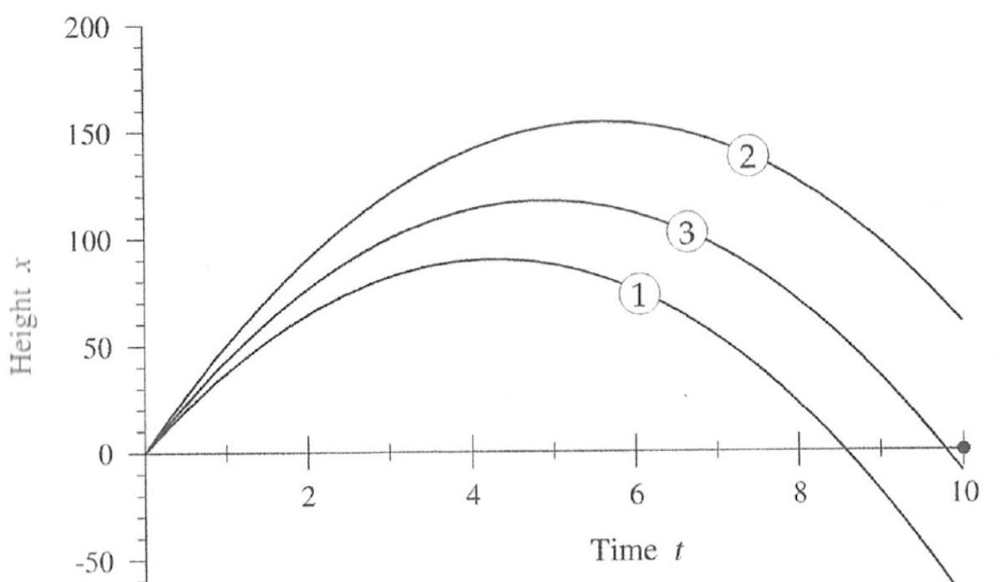

In [25]:
from IPython.display import Image, display
display(Image("G:\\My Drive\\Classes\\Ph322\\2026\\Lectures\\Figures\\shooting_method_fig8.11.png"))

**Figure 8.11**

Consider solving the differential equation:

$$
\frac{d^2x}{dt^2} = -g
$$

that governs the flight of a ball without air resistance, where $x$ is the height of the ball.  One of the boundary conditions is that the solution has to pass through x=0 m, at t=10s. That is the ball must last land at t=10s. We are not given the initial velocity. 

We then guess an initial velocity, $v_1$, and using one of our ODE methods, say 4th-order RK, we calculate the solution up to the end of the interval.


Likely we'll find the height of the ball is not 0 m at t=10s. So we update our guess for the initial velocity. We continue until the height of the ball is 0 m at t=10s.

The biggest question is, how do we update our guess of the initial velocity for each iteration?

Well consider that each initial velocity $v_0$, produces a solution at t=10s, call it $x$. Therefore we effectively have a function for the height of th ball $x(v_0)$. 

We want to find $v_0$ such that $x(v_0)=x_t$, where $x_t=10$ m in this case, or equivalently;

$$
x(v_0)-x_t = 0
$$

or 

$$
f(v_0)=0,
$$

where $f(v_0) = x(v_0)-x_t$.


But this is just the type of equation we solved earlier this term using methods such as binary search. So the basic idea is to use a binary search method to find the initial condition of the solution such that the solution satisfies the boundary condition. 


The only real difference is that the function $f(v_0)$ is a bit more complicated because it requires us to compute one complete solution of $x(t)$ using Runge-Kutta or other methods, for each sample of $v_0$. But other than that the algorithm proceeds in the same way.

To solve the boundary-value problem requires us to merge two of our methods, the binary search (or other root-finding method) and the 4th-order RK (or other ODE method).

$$
\frac{d^2x}{dt^2} = -g
$$

Break this into two 1st-order equations:

$$
\frac{dx}{dt} = y
$$

$$
\frac{dy}{dt} = -g
$$

Boundary conditions:

$$
x=0, t=0 \qquad x=0, t=10
$$


Since we need to calculate the solution to these differential equations for every guess of our initial velocity, it is best if write a function that performs the Runge-Kutta method. The only variable that changes every time we compute a new solution is the initial velocity, so we should pass $v_0$ to the function.

Otherwise we can just copy our previous programs for binary search and Runge-Kutta methods. 

Let's see what the code looks like. 

* The program includes a function $fv()$ that returns $x(v_0)-x_t$, the difference between calculated height at t=10 seconds, and the boundary condition. 
* Within the function I define the function $f(r,t)$ which contains the functions $f_x$, $f_y$, which are needed to solve the differential equation. 
* I set the initial velocity equal to the velocity that is passed to $f_v()$. 
* I need to bracket the correct initial velocity. So I choose 0 m/s as my lower estimate and 100 m/s as my upper estimate. In general I need to test whether the root lies between these two. 
* I use my binary search code from earlier problems pretty much as is, and use the value of the function $f(v)$ in my search. 
* If I want to plot the solution, I will also need to return $x$ at all time steps. This isn't necessary if you only want to know the correct initial velocity.

In [ ]:
# Use binary search and 4th-order RK to solve boundary value problem

import numpy as np
import matplotlib.pyplot as plt

# create function to find x(t) for a given initial velocity using RK4. 
def fv(v):
    
    
# Main body


# define target error

# define initial bracket of V0 , m/s


# evaluate function at bracket points 

    
# perform binary search if f1, f2 have different signs

# continue searching until interval is smaller than target error
    

# return midpoint of last interval


# get solution for optimal velocity





This should give you a general idea how to solve differential equations with boundary conditions. There are other methods including the relaxation method, where we make an initial guess about the solution across the entire time interval but fixed at the boundary value. We then recalculate the solution using this guess and continue iterating until the solution converges, just like in the relaxation method we used to solve nonlinear equations. We will use this method in the next chapter where we solve partial differential equations. 